# Import Library

In [1]:
!python --version

Python 3.12.12


In [2]:
!pip install skl2onnx onnx onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.6 MB/s eta 0:00:00


In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from scipy.signal import convolve2d
import skl2onnx
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
from sklearn.preprocessing import MinMaxScaler
import onnx
import warnings
import joblib
import re
import random
import onnxruntime as ort
from google.colab import files
from collections import defaultdict, OrderedDict
import glob

warnings.filterwarnings('ignore')

# Load Gambar

In [4]:
!unzip /content/drive/MyDrive/dataset_ts_new.zip

Archive:  /content/drive/MyDrive/dataset_ts_new.zip
   creating: dataset_ts_new/
   creating: dataset_ts_new/test/
   creating: dataset_ts_new/test/lampu-merah/
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (100).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (71).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (72).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (73).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (74).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (75).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (76).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (77).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (78).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (79).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (80).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (81).jpg  
  inflating: dataset_t

In [5]:
def load_dataset(img_dir):
    p = Path(img_dir)
    dirs = p.glob('*')
    img_list = []

    for dir_path in dirs:
        if not dir_path.is_dir():
            continue

        label = str(dir_path).split('/')[-1]

        for file in dir_path.glob('*.jpg'):
            try:
                img_bgr = cv2.imread(str(file))
                img_bgr = cv2.resize(img_bgr, [64, 64])

                if img_bgr is not None:
                    img_list.append((img_bgr, label))

            except Exception as e:
                print(f"Error memuat file {file}: {e}")

    return img_list

In [6]:
train_dir = "/content/dataset_ts_new/train/"
test_dir = "/content/dataset_ts_new/test/"

train_data = load_dataset(train_dir)
test_data = load_dataset(test_dir)

full_dataset = train_data + test_data
print(f"\nTotal Sampel Keseluruhan: {len(full_dataset)}")

images = [item[0] for item in full_dataset]
labels = [item[1] for item in full_dataset]


Total Sampel Keseluruhan: 1300


70:30

In [7]:
X_train_img_73, X_test_img_73, y_train_str_73, y_test_str_73 = train_test_split(
    images,
    labels,
    test_size=0.3,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (70%): {len(X_train_img_73)}")
print(f"Jumlah Sampel Testing (30%): {len(X_test_img_73)}")

Jumlah Sampel Training (70%): 910
Jumlah Sampel Testing (30%): 390


80:20

In [8]:
X_train_img_82, X_test_img_82, y_train_str_82, y_test_str_82 = train_test_split(
    images,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (80%): {len(X_train_img_82)}")
print(f"Jumlah Sampel Testing (20%): {len(X_test_img_82)}")

Jumlah Sampel Training (80%): 1040
Jumlah Sampel Testing (20%): 260


90:10

In [9]:
X_train_img_91, X_test_img_91, y_train_str_91, y_test_str_91 = train_test_split(
    images,
    labels,
    test_size=0.1,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (90%): {len(X_train_img_91)}")
print(f"Jumlah Sampel Testing (10%): {len(X_test_img_91)}")

Jumlah Sampel Training (90%): 1170
Jumlah Sampel Testing (10%): 130


# Pre-processing (HSV)

In [10]:
def hsv_preprocessing(images, labels, list_label):
    hsv_img_list = []
    class_list = list_label.copy()
    for i, l in zip(images, labels):
      hsv_image = cv2.cvtColor(i, cv2.COLOR_BGR2HSV)
      color_hist = cv2.calcHist([hsv_image], [0, 1], None, [16, 8], [0, 180, 0, 256])

      cv2.normalize(color_hist, color_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

      color_features = color_hist.flatten()

      hsv_img_list.append(color_features)

      if l in class_list:
        class_list.remove(l)

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(f"Analisis Gambar (Kelas: {l})", fontsize=16)

        img_rgb = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
        axes[0].imshow(img_rgb)
        axes[0].set_title("1. Gambar Asli (RGB)")
        axes[0].axis('off')

        h_channel = hsv_image[:, :, 0]

        axes[1].hist(h_channel.flatten(), bins=180, range=[0, 180], color='blue')
        axes[1].set_title("2. Histogram Persebaran Warna (Hue)")
        axes[1].set_xlabel("Nilai Hue (0-179)")
        axes[1].set_ylabel("Jumlah Piksel")
        axes[1].set_xlim([0, 180])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    return hsv_img_list

In [11]:
list_label = [
    'lampu-merah',
    'larangan-belok-kiri', 'larangan-berhenti',
    'larangan-berjalan-terus-wajib-berhenti-sesaat',
    'larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor',
    'larangan-memutar-balik', 'larangan-parkir',
    'peringatan-pintu-perlintasan-kereta-api',
    'perintah-pilihan-memasuki-salah-satu-jalur', 'petunjuk-area-parkir',
    'petunjuk-lokasi-pemberhentian-bus', 'petunjuk-lokasi-putar-balik',
    'petunjuk-penyeberangan-pejalan-kaki'
]

70:30

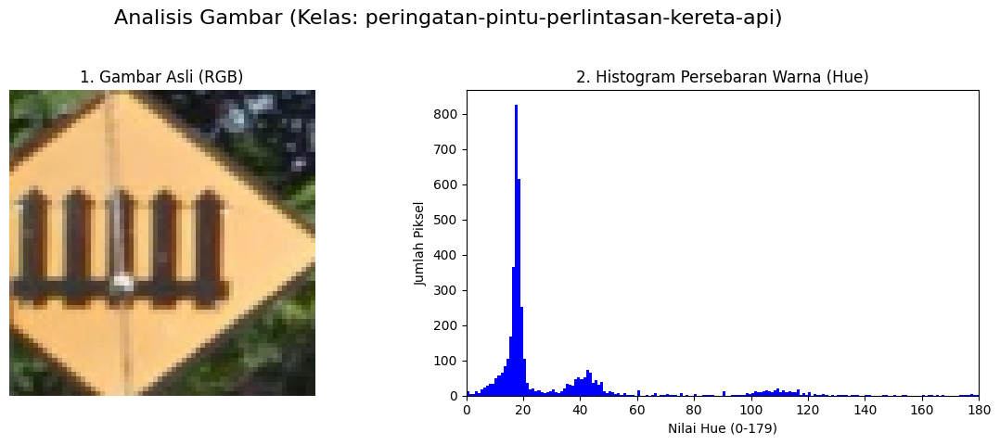

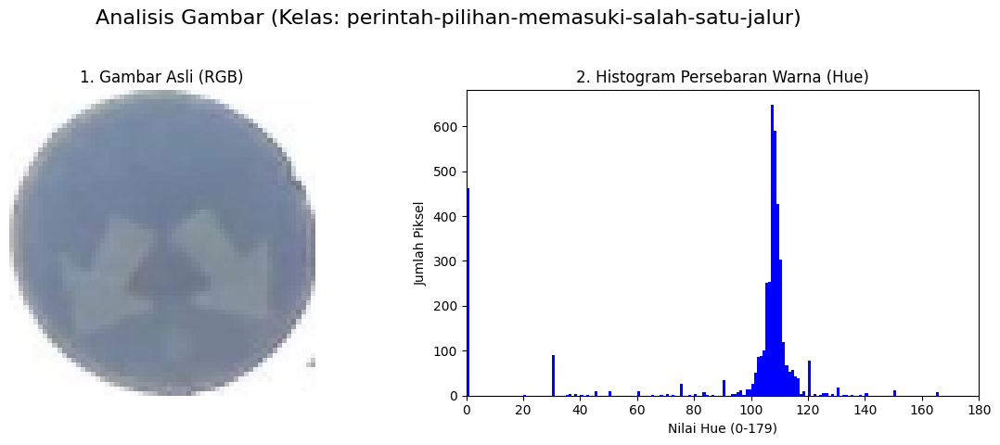

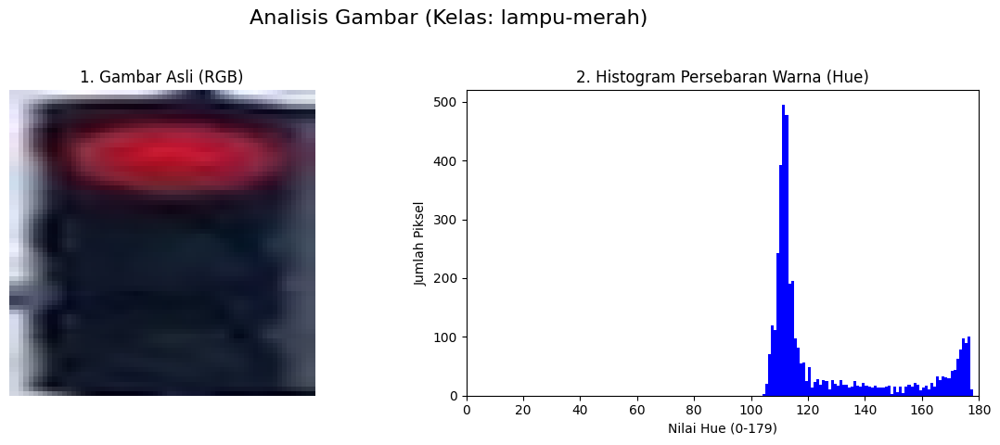

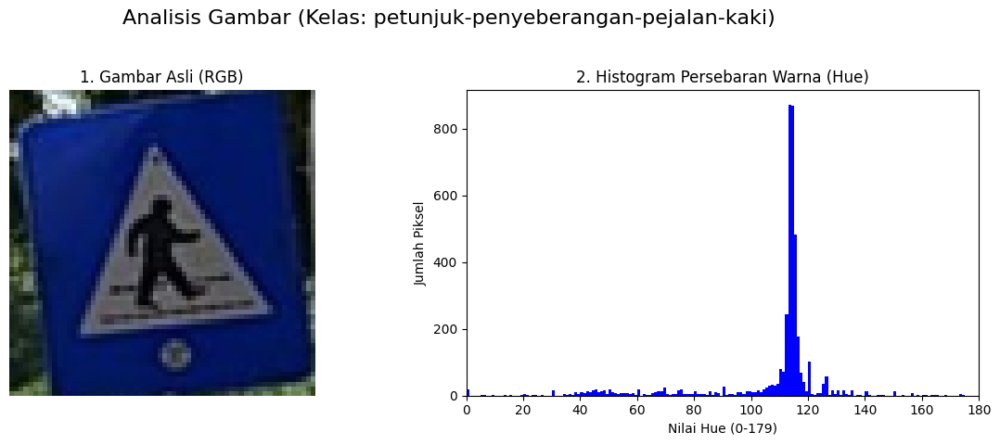

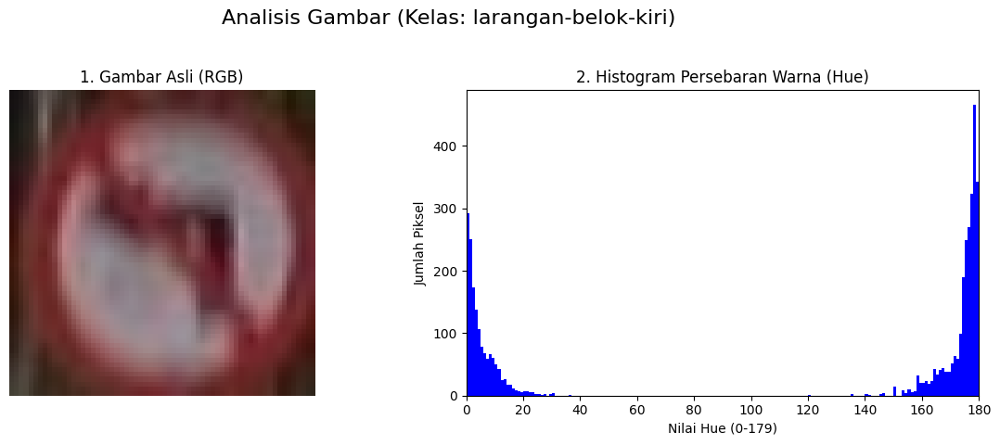

...

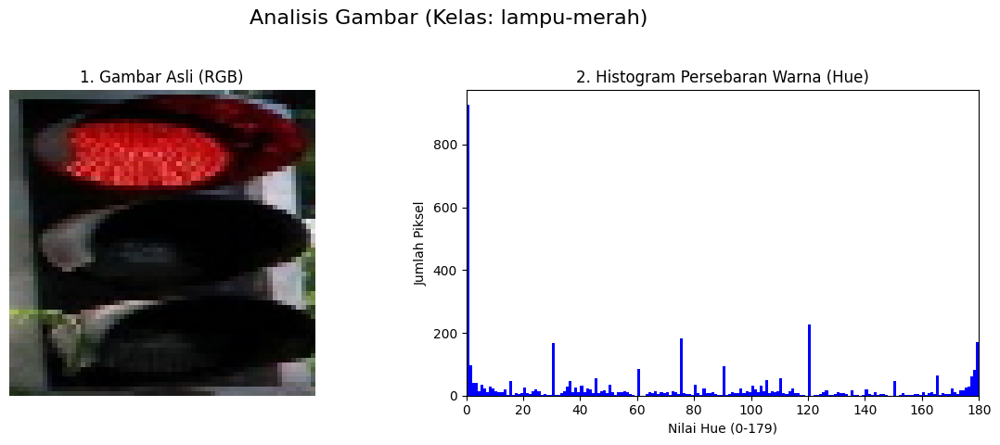

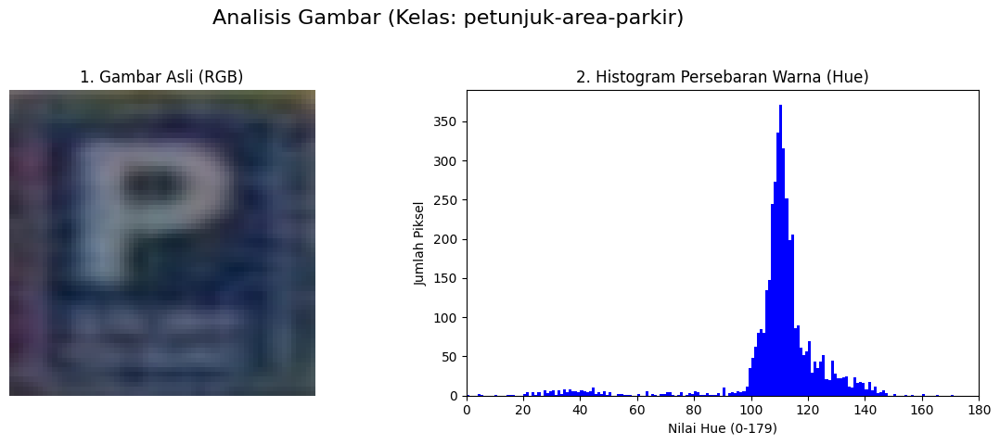

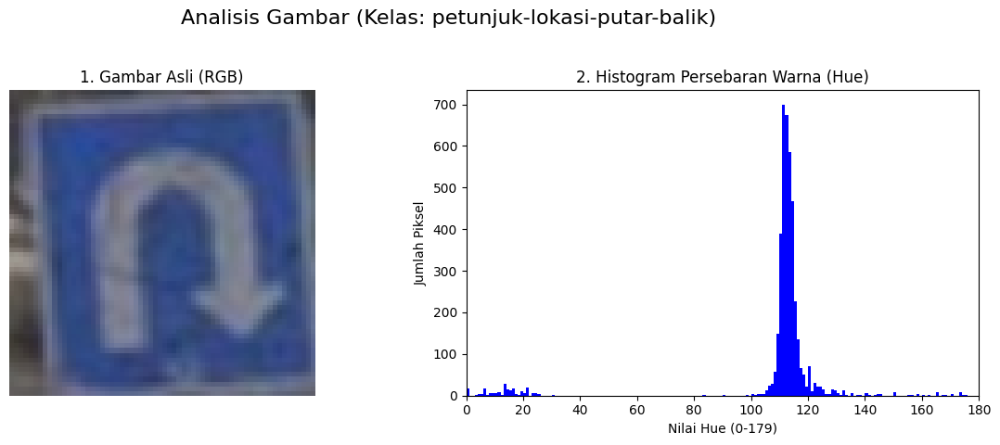

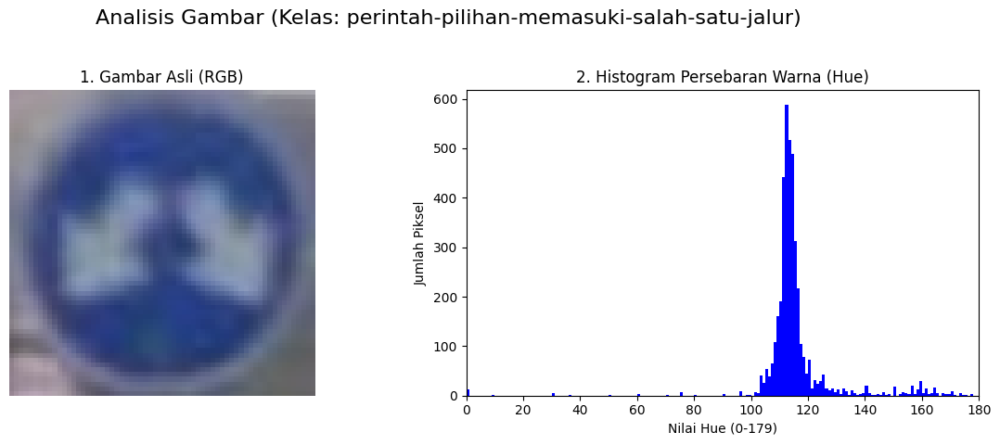

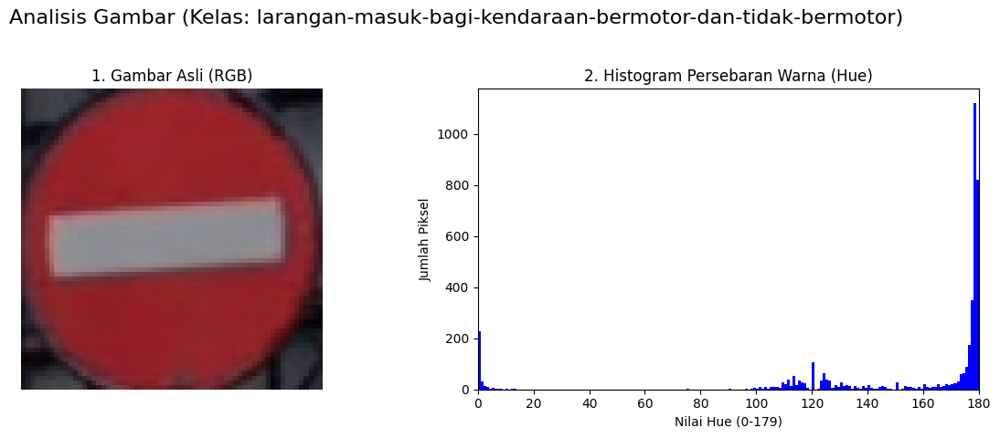

In [12]:
train_hsv_73 = hsv_preprocessing(X_train_img_73, y_train_str_73, list_label)
test_hsv_73 = hsv_preprocessing(X_test_img_73, y_test_str_73, list_label)

80:20

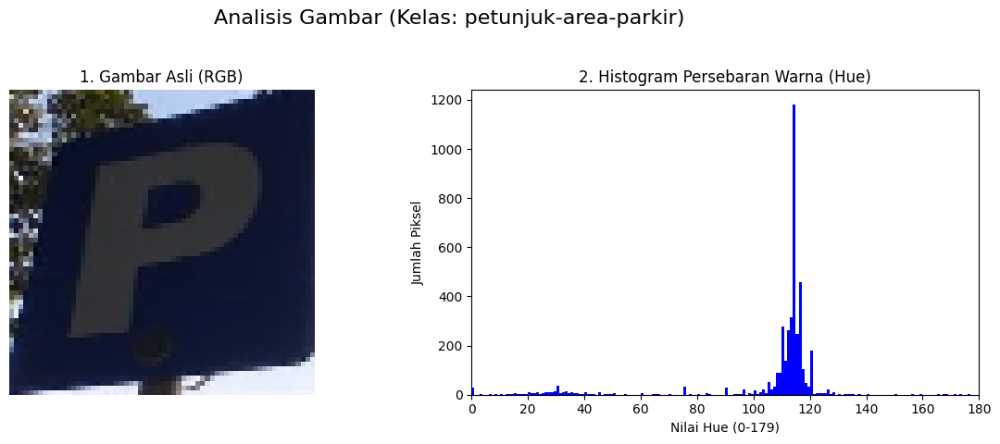

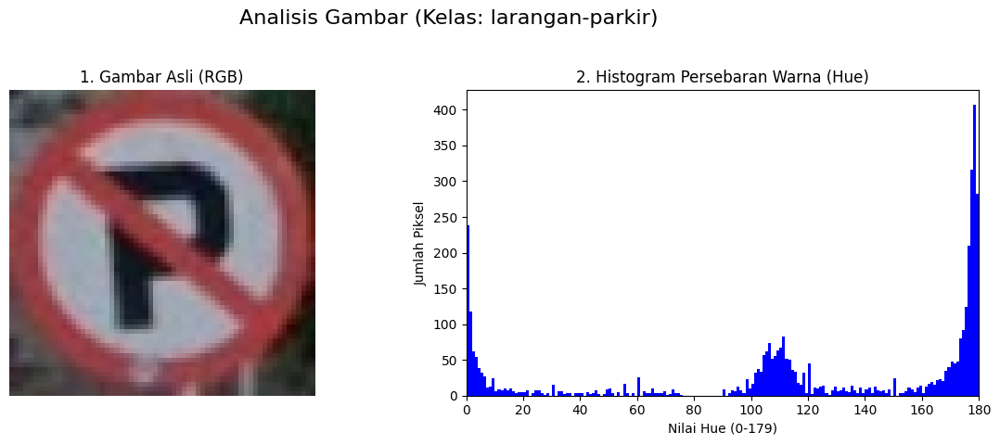

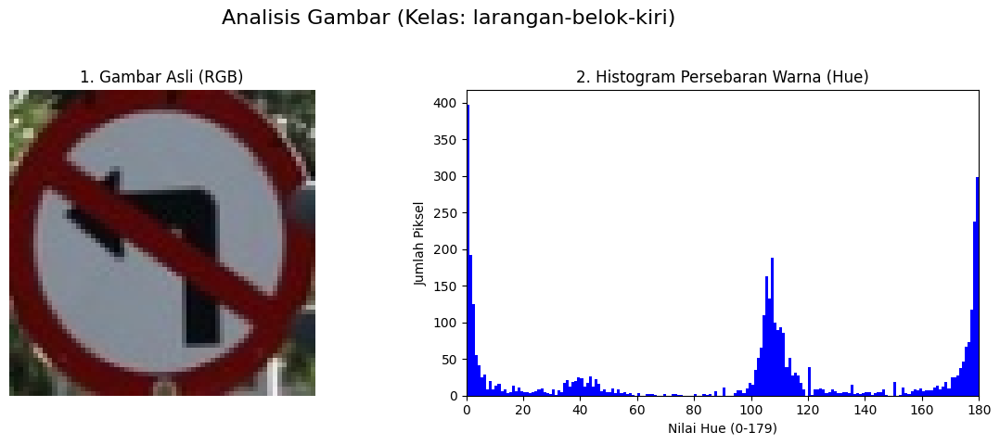

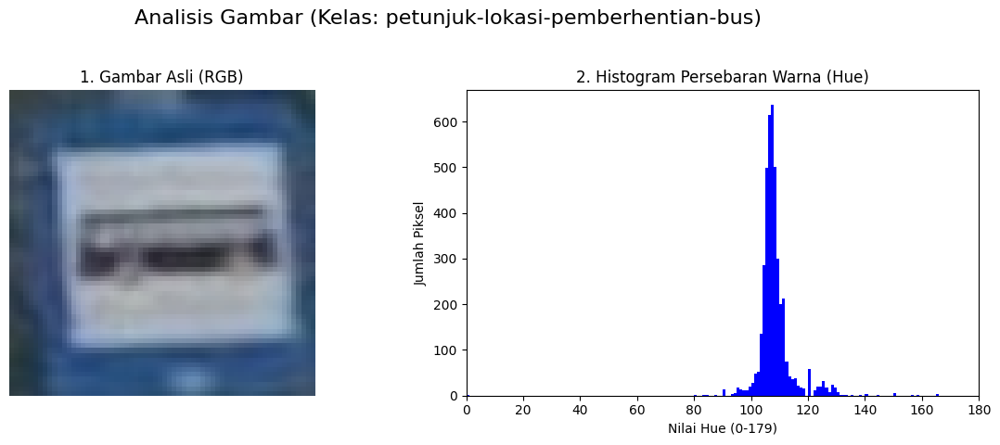

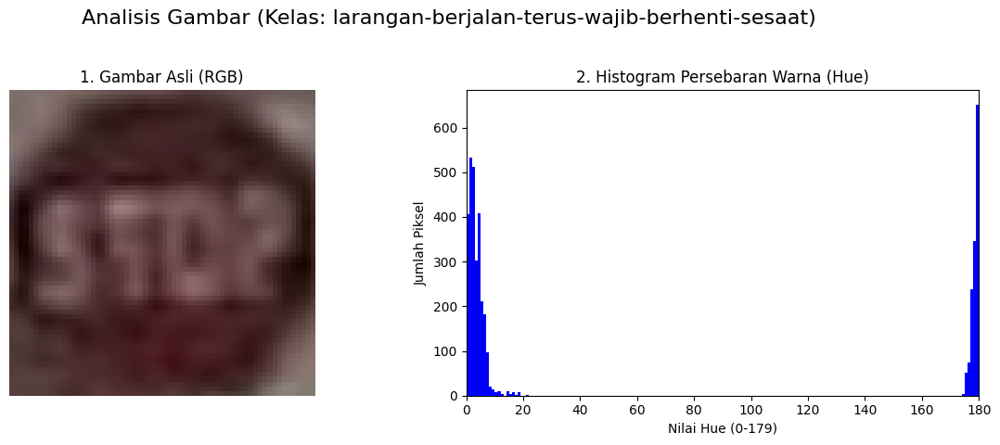

...

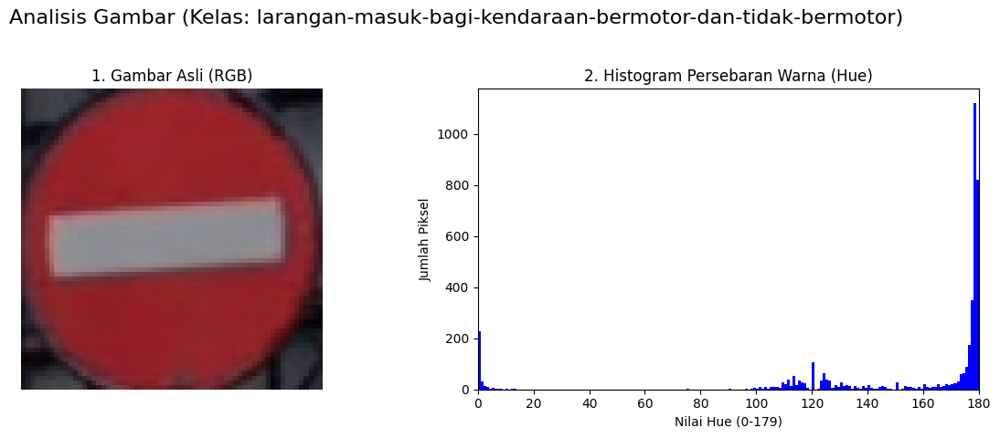

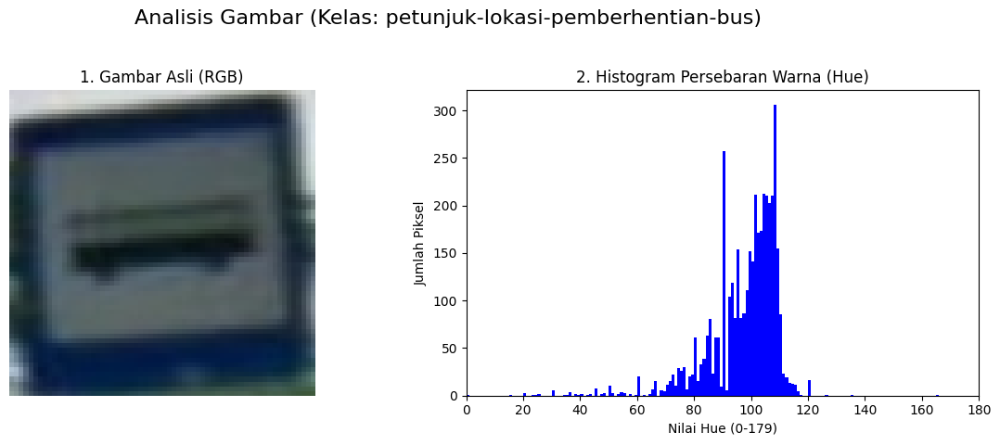

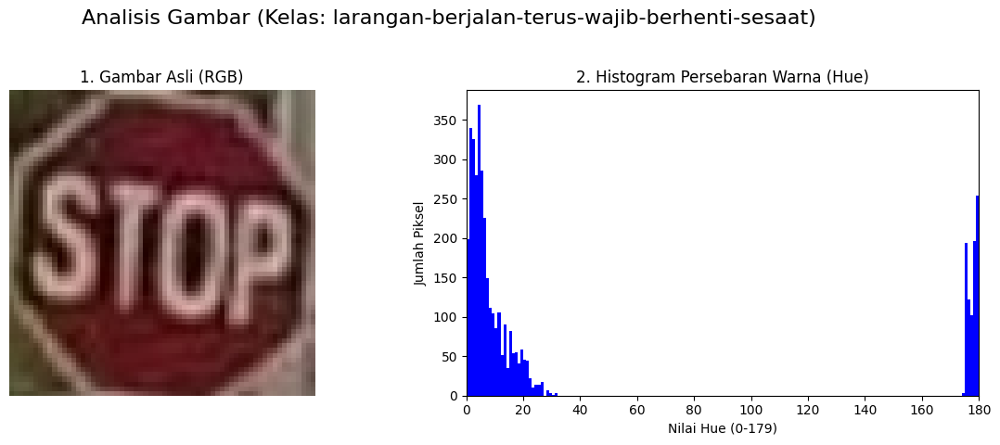

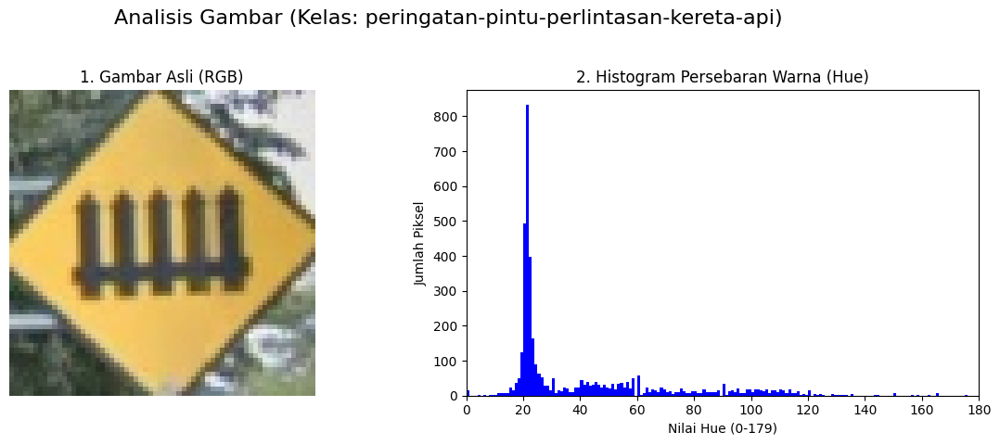

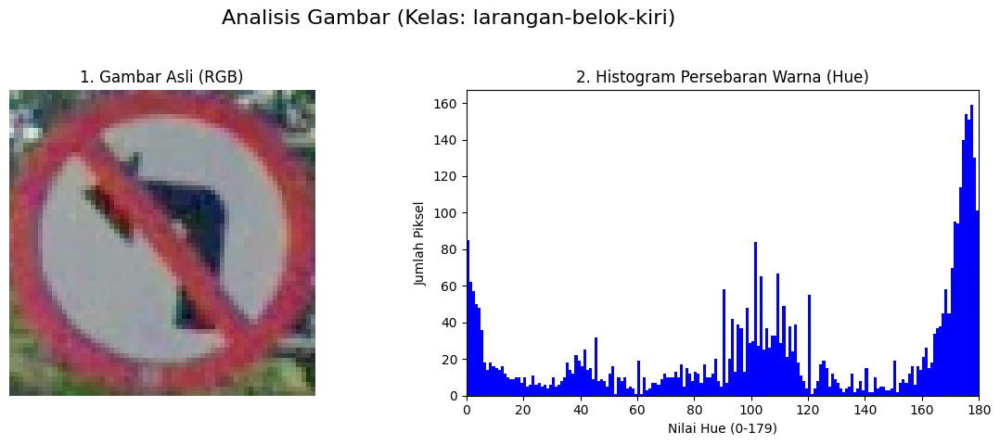

In [13]:
train_hsv_82 = hsv_preprocessing(X_train_img_82, y_train_str_82, list_label)
test_hsv_82 = hsv_preprocessing(X_test_img_82, y_test_str_82, list_label)

90:10

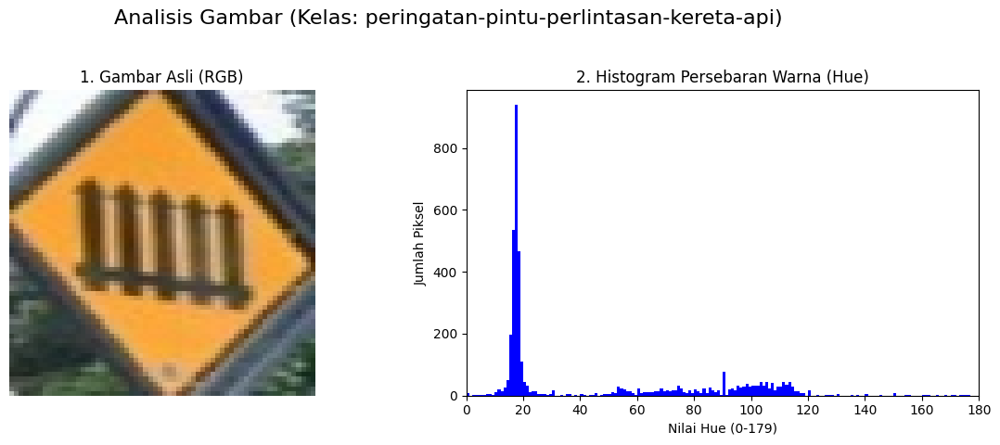

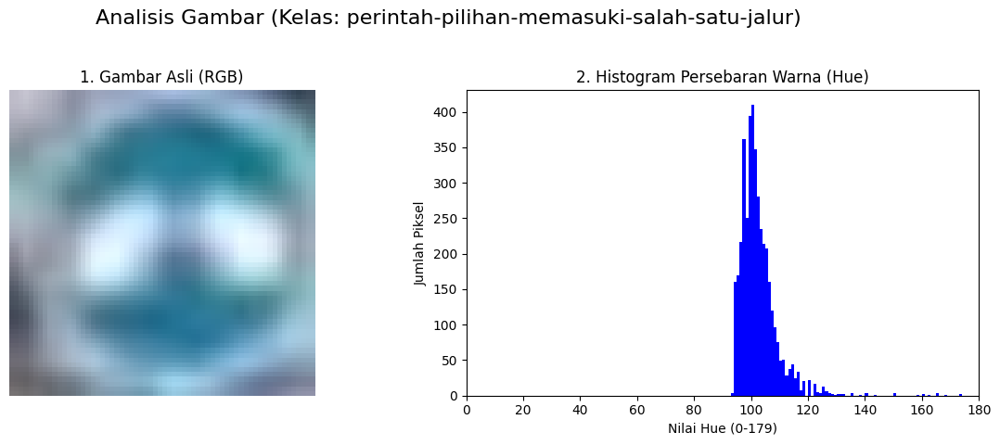

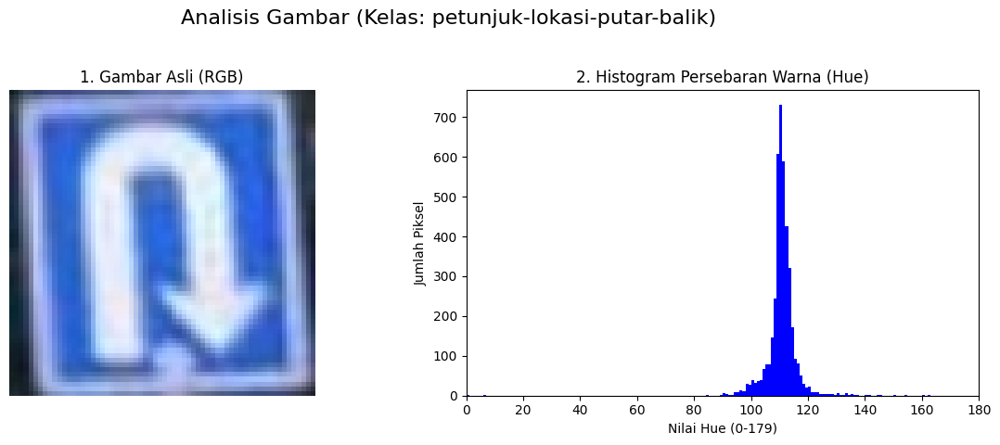

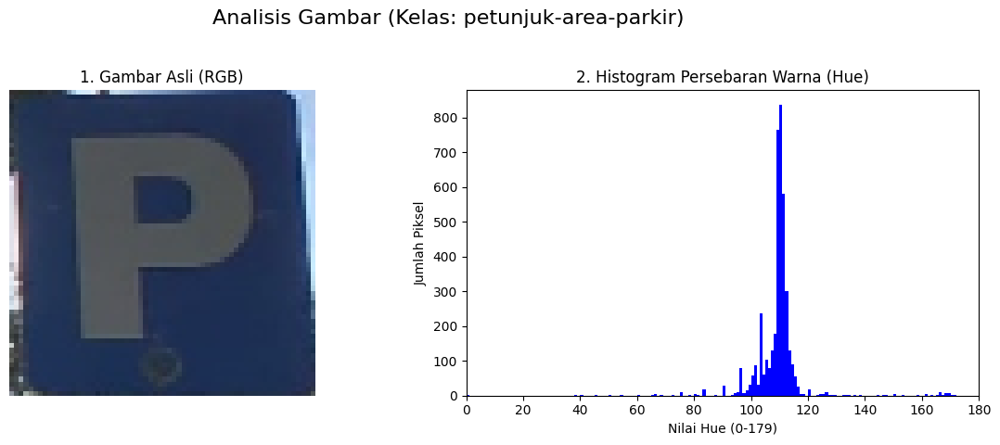

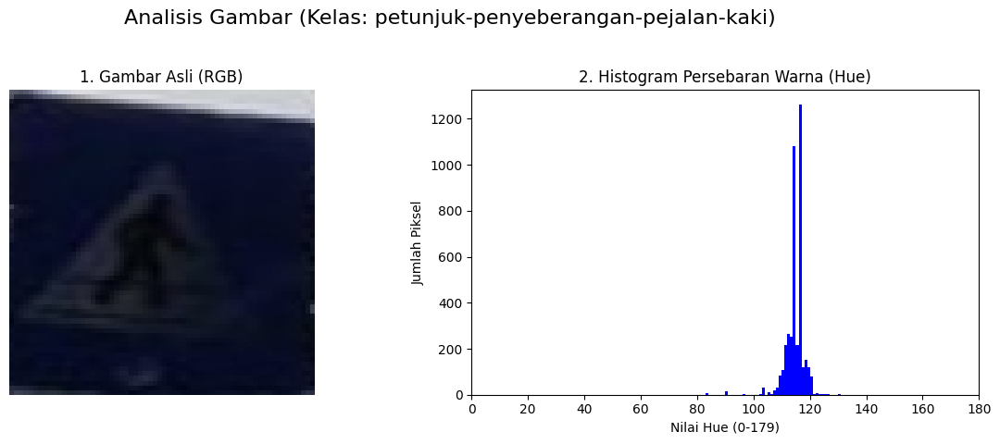

...

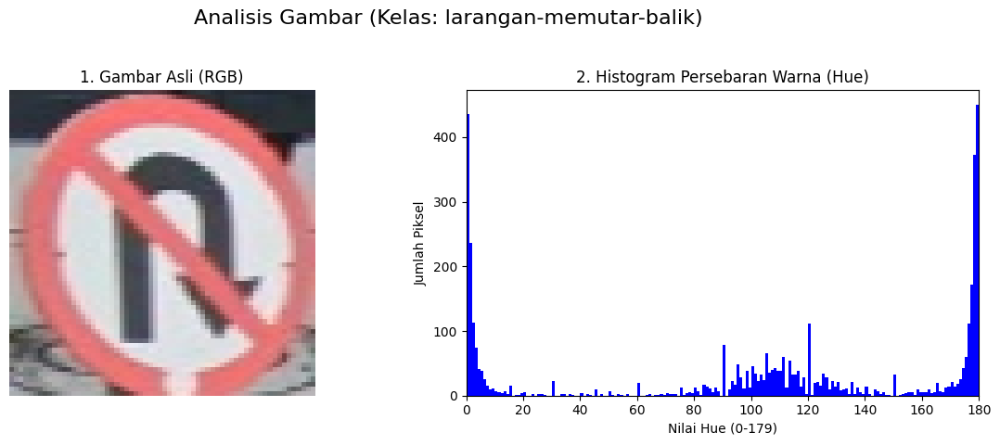

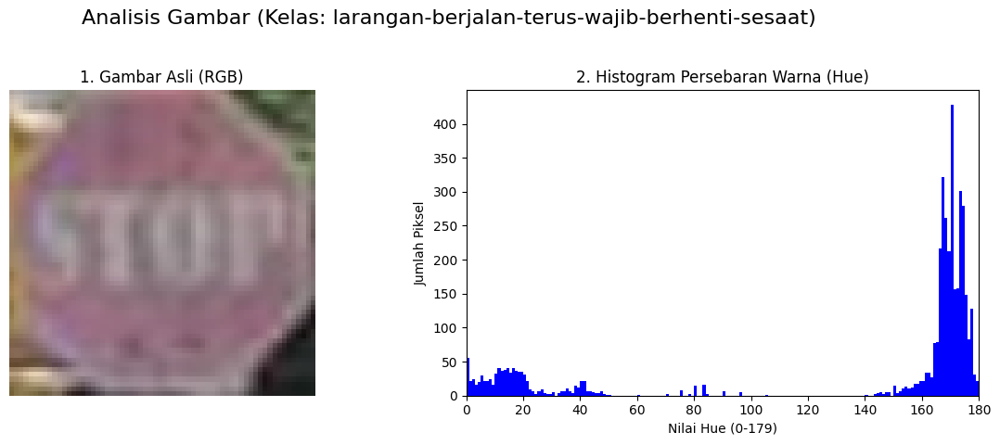

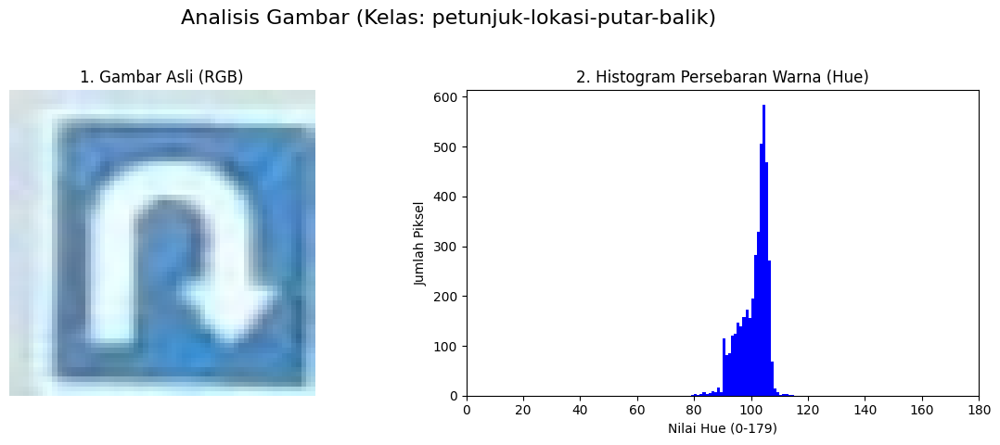

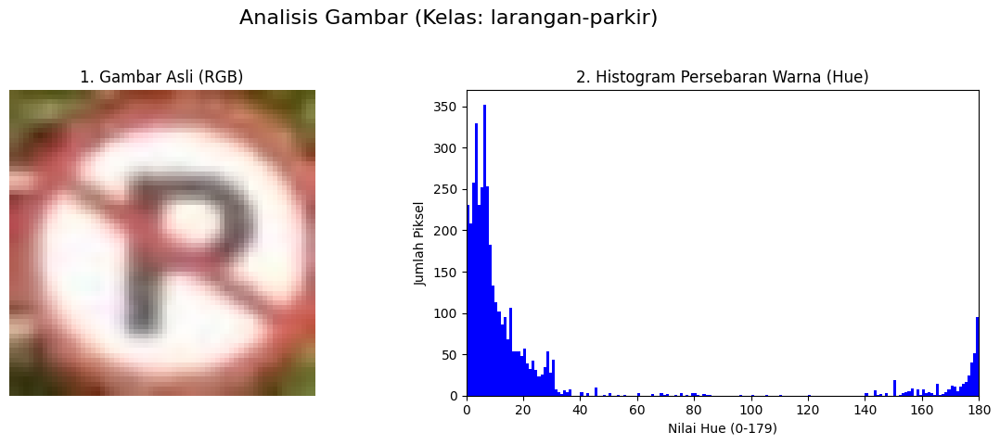

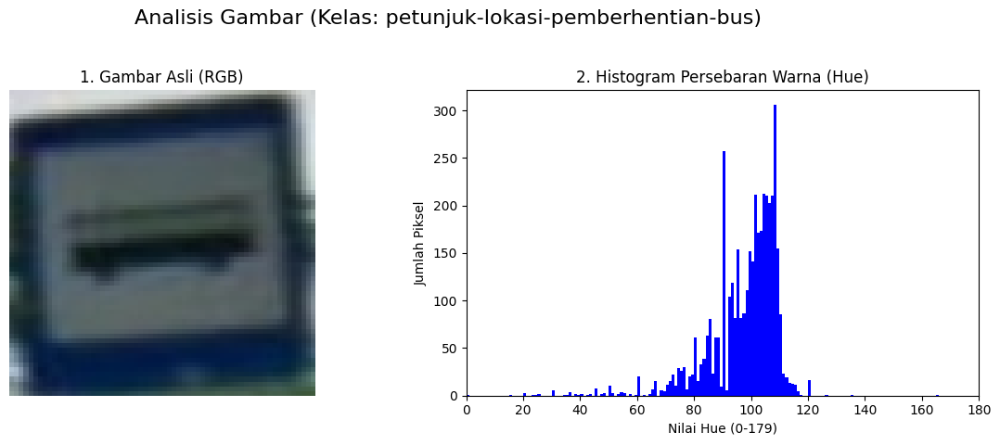

In [14]:
train_hsv_91 = hsv_preprocessing(X_train_img_91, y_train_str_91, list_label)
test_hsv_91 = hsv_preprocessing(X_test_img_91, y_test_str_91, list_label)

# Feature Extraction (HOG)

In [15]:
def hog_feature_extraction(images, labels, list_label):
  hog_img_list = []
  class_list = list_label.copy()
  for i, l in zip(images, labels):
    resized_img_rgb = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)

    gray_image = rgb2gray(resized_img_rgb)
    hog_features, hog_image_visual = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

    hog_img_list.append(hog_features)


    if l in class_list:
      class_list.remove(l)

      fig, axes = plt.subplots(1, 3, figsize=(20, 5))
      fig.suptitle(f"Visualisasi Tahapan Ekstraksi Fitur {l} ", fontsize=16)

      axes[0].imshow(resized_img_rgb)
      axes[0].set_title(f"1. Resized\nBentuk: {resized_img_rgb.shape}")
      axes[0].axis('off')

      axes[1].imshow(gray_image, cmap='gray')
      axes[1].set_title(f"2. Grayscale\nBentuk: {gray_image.shape}")
      axes[1].axis('off')

      axes[2].imshow(hog_image_visual, cmap='gray')
      axes[2].set_title(f"3. Visualisasi HOG\n(Bentuk Asli: {hog_image_visual.shape})")
      axes[2].axis('off')

      plt.tight_layout(rect=[0, 0.03, 1, 0.90])
      plt.show()

  return hog_img_list

70:30

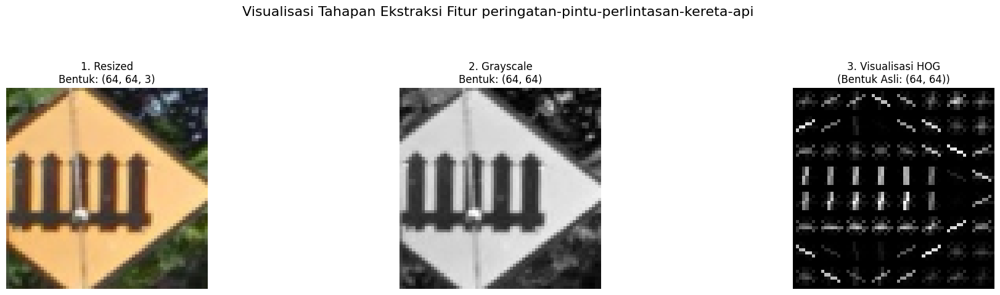

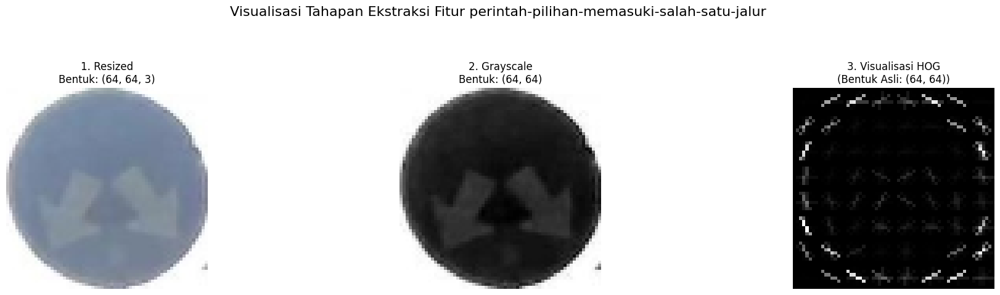

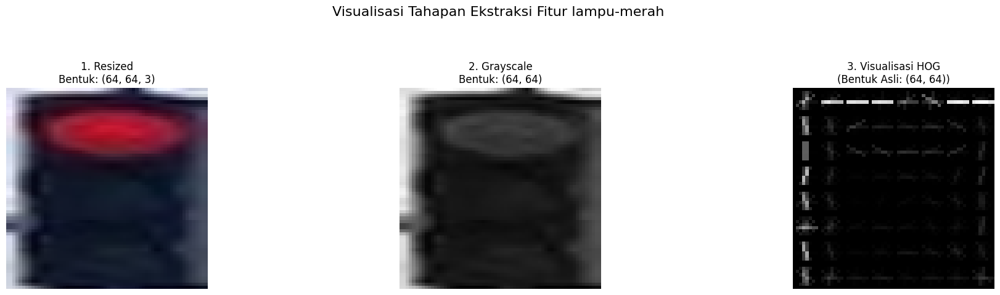

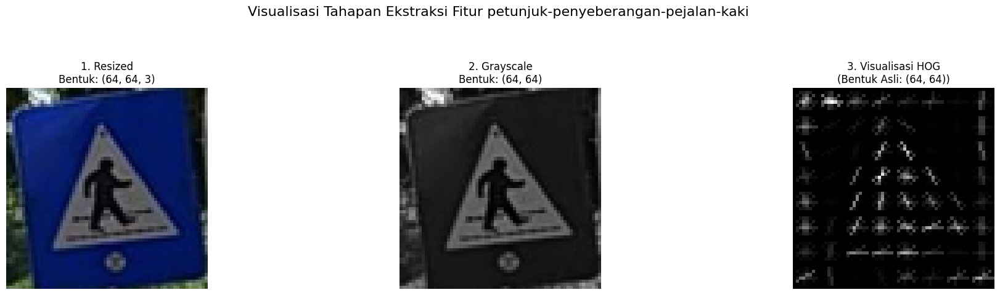

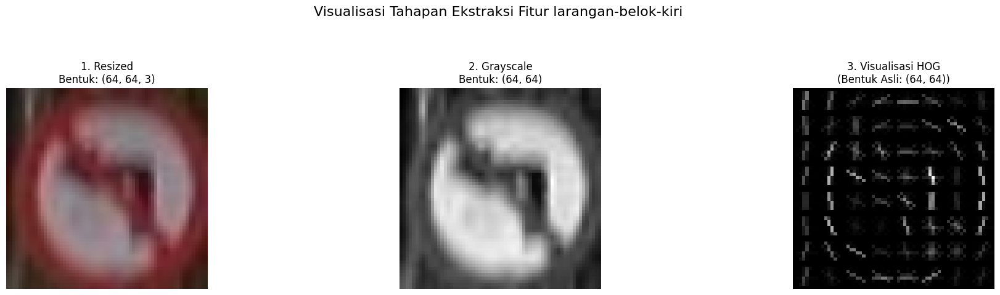

...

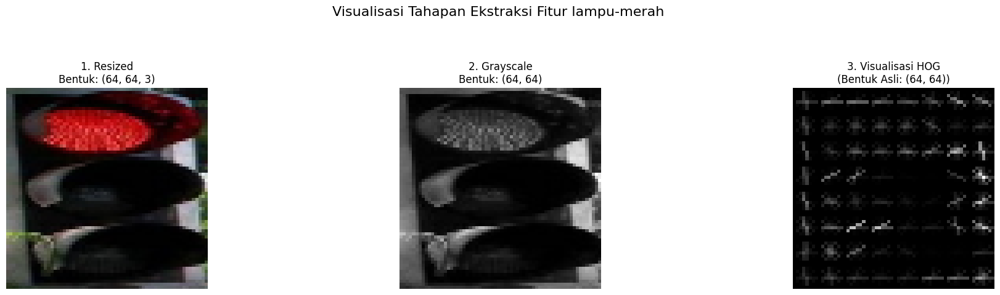

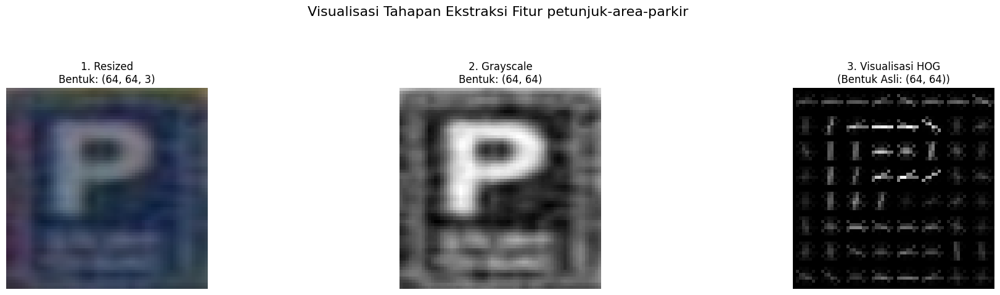

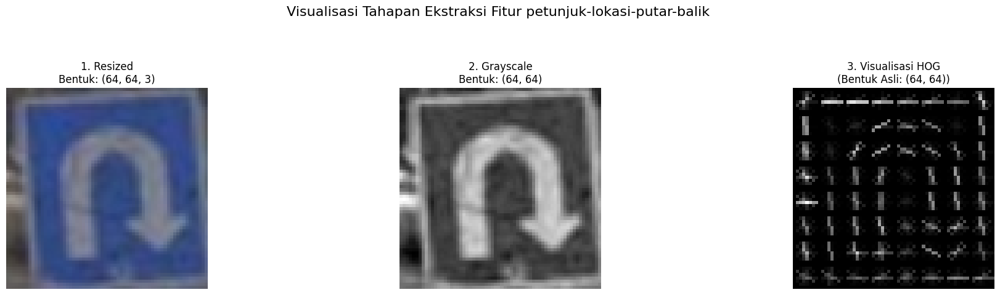

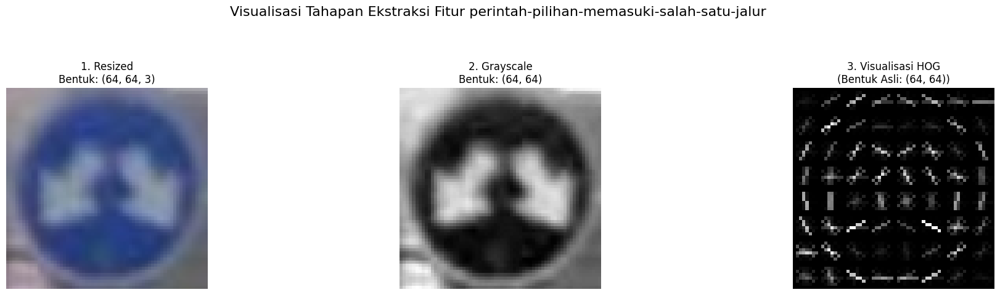

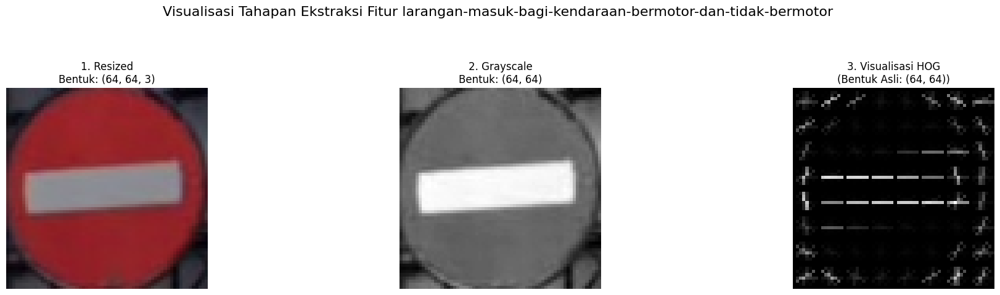

In [16]:
train_hog_73 = hog_feature_extraction(X_train_img_73, y_train_str_73, list_label)
test_hog_73 = hog_feature_extraction(X_test_img_73, y_test_str_73, list_label)

80:20

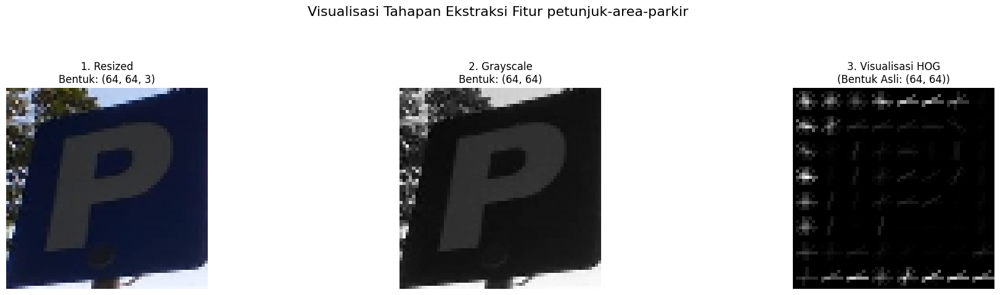

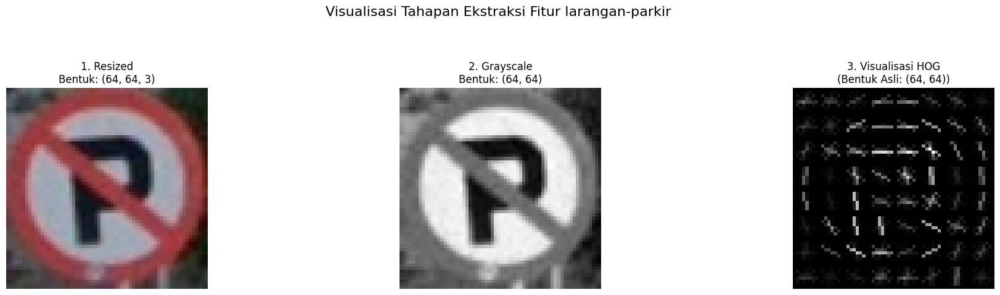

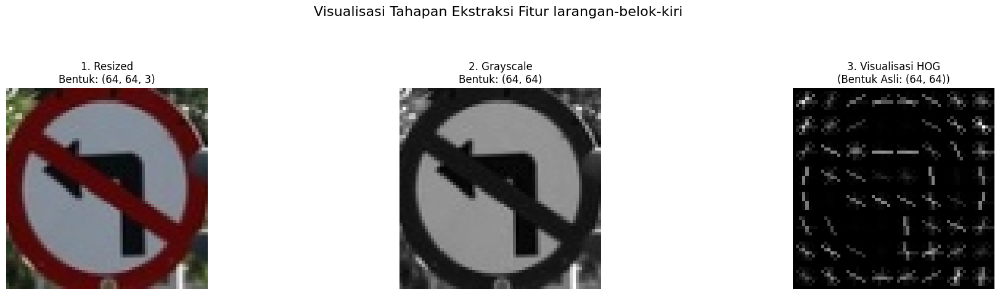

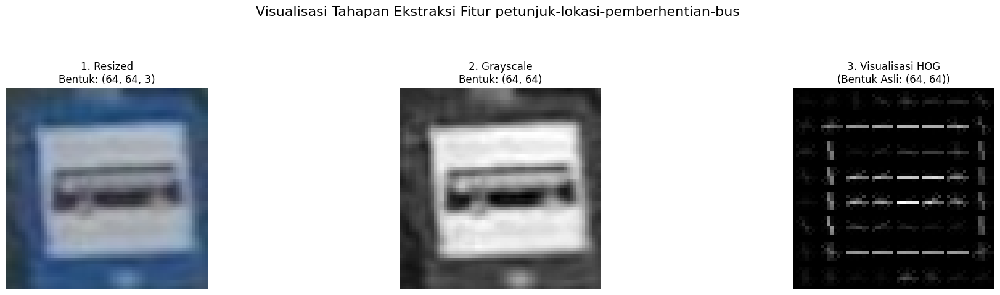

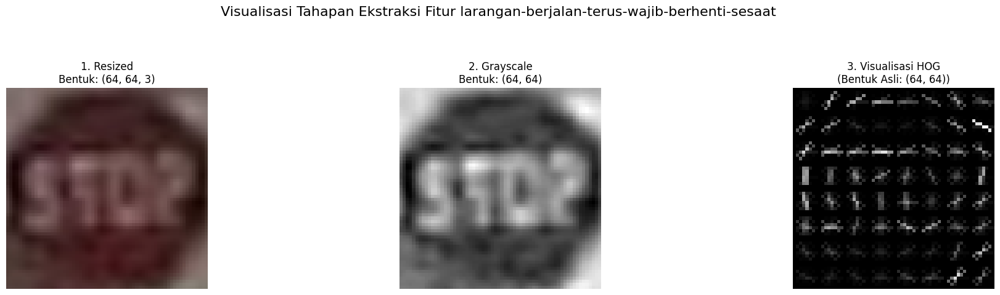

...

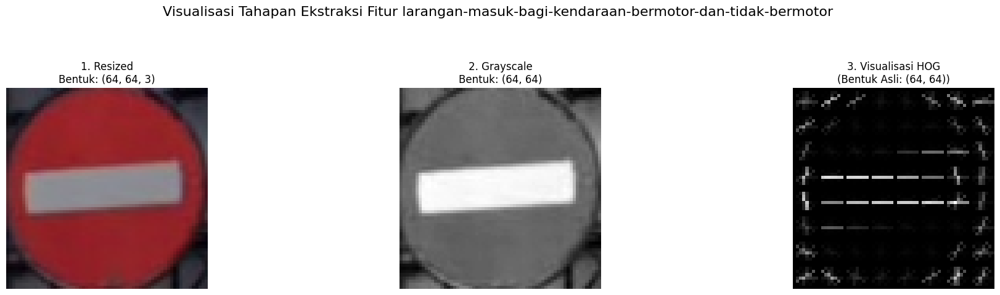

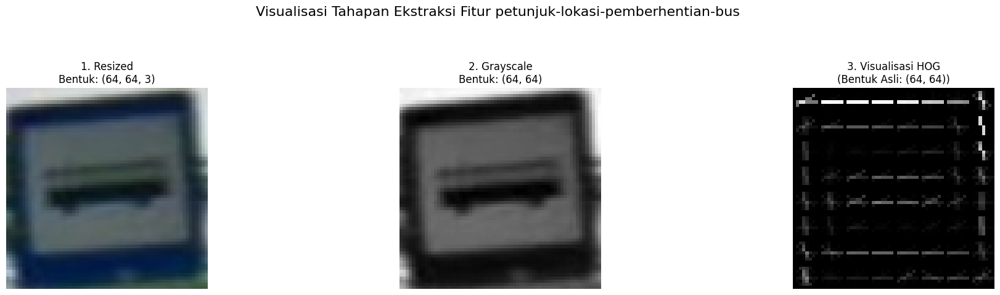

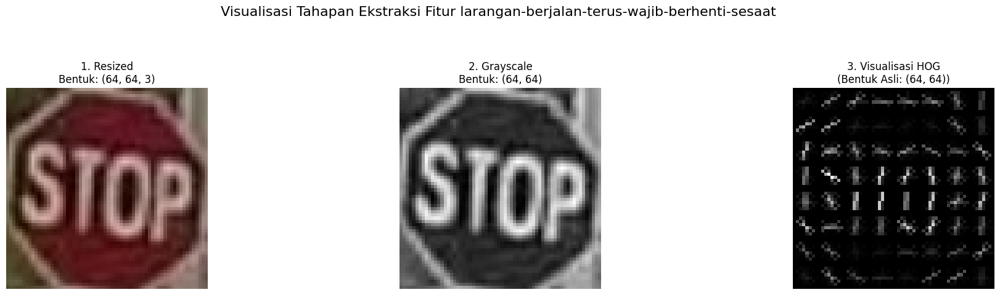

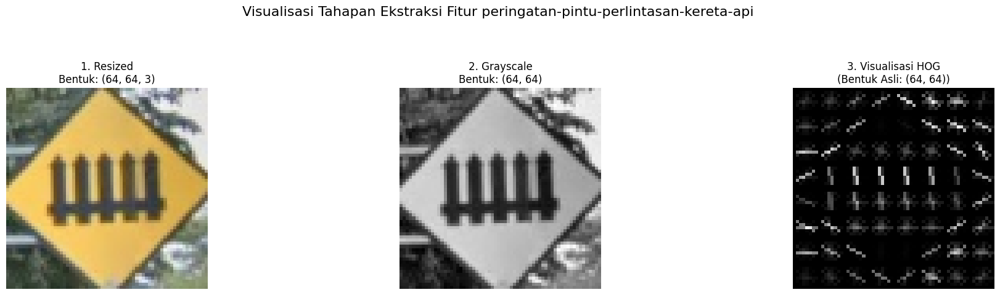

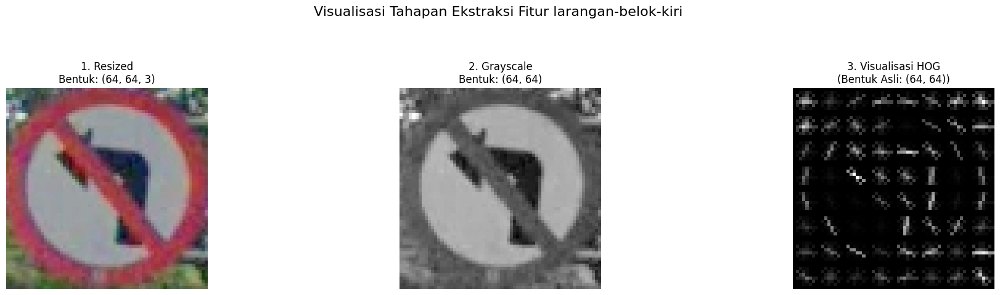

In [17]:
train_hog_82 = hog_feature_extraction(X_train_img_82, y_train_str_82, list_label)
test_hog_82 = hog_feature_extraction(X_test_img_82, y_test_str_82, list_label)

90:10

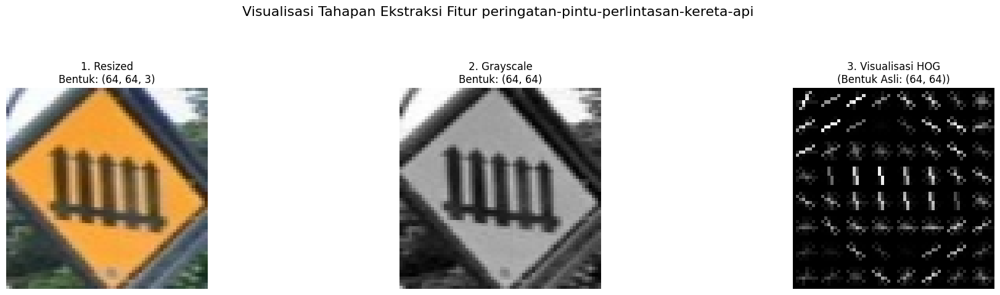

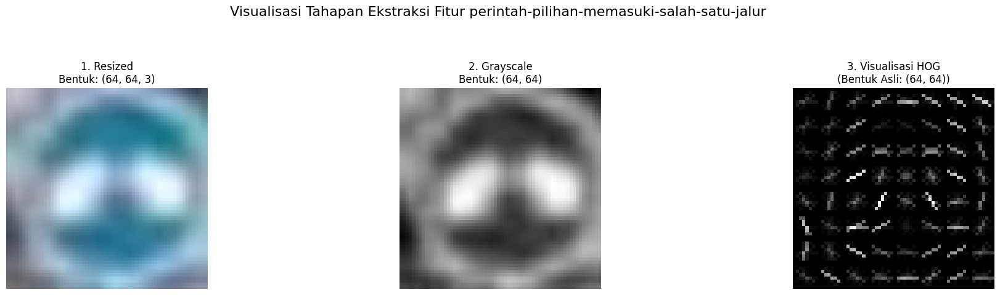

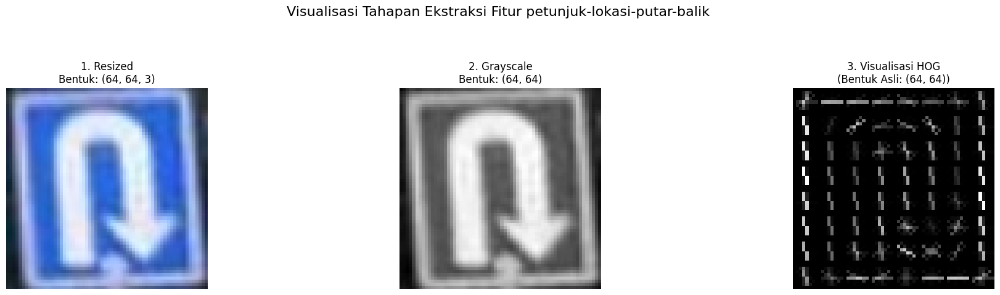

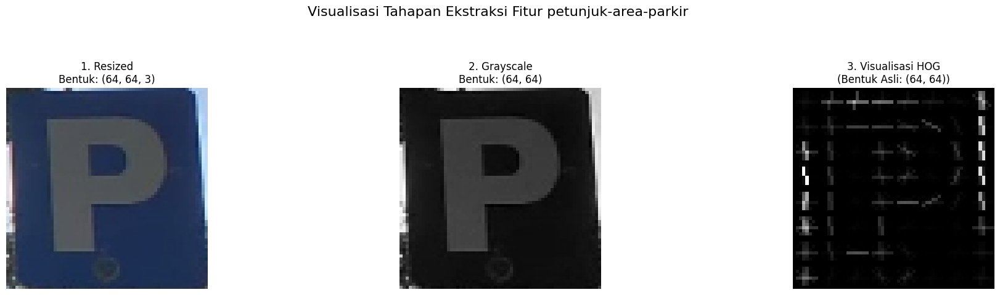

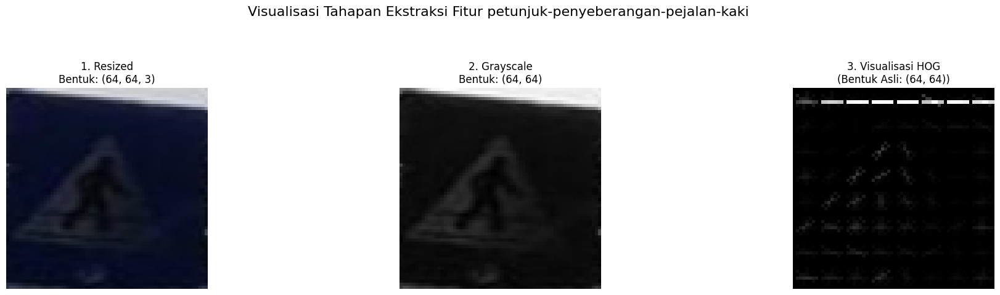

...

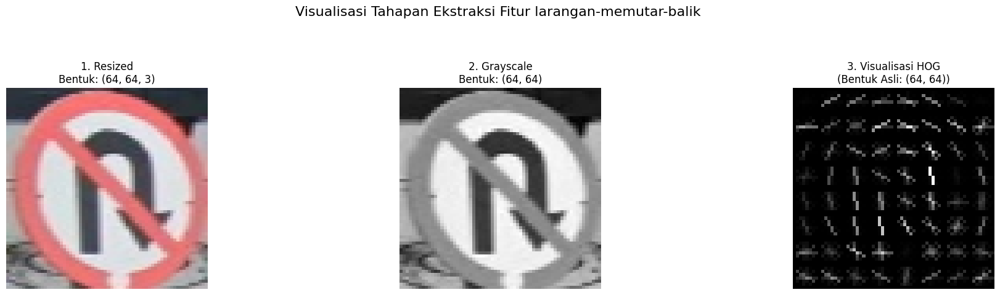

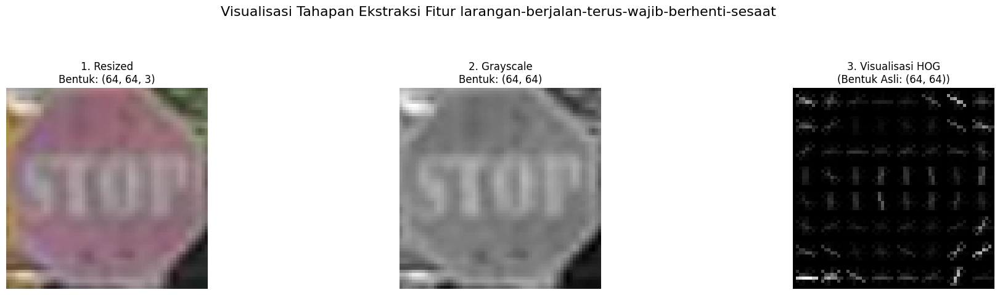

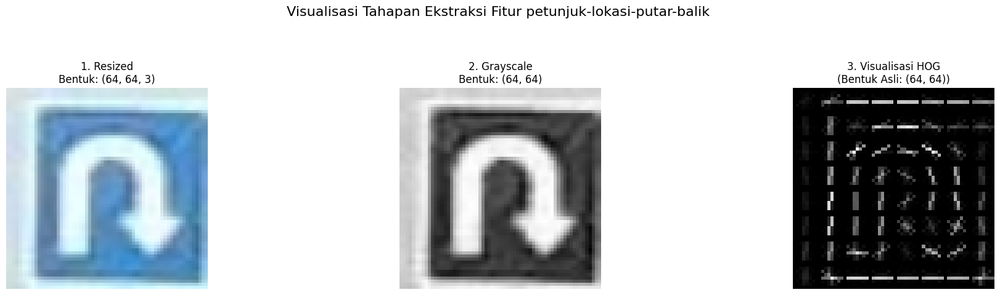

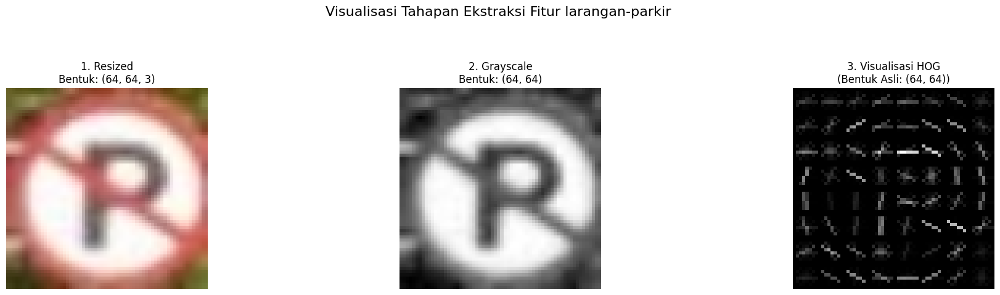

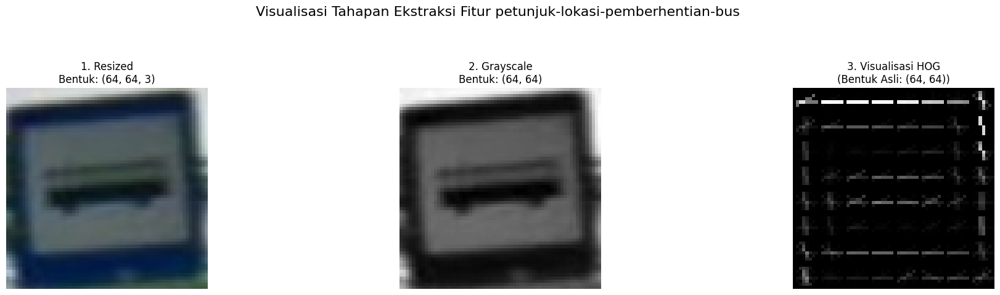

In [18]:
train_hog_91 = hog_feature_extraction(X_train_img_91, y_train_str_91, list_label)
test_hog_91 = hog_feature_extraction(X_test_img_91, y_test_str_91, list_label)

# Hybrid Feature

In [19]:
def hybrid_feature(hsv, hog):
  hybrid_feature_list = []
  for i in range(len(hsv)):
    hg = hog[i]
    hs = hsv[i]

    hybrid_feature_list.append(np.concatenate([hg, hs]))
  return hybrid_feature_list

70:30

In [20]:
X_train_features_73 = hybrid_feature(train_hsv_73, train_hog_73)
X_test_features_73 = hybrid_feature(test_hsv_73, test_hog_73)

80:20

In [21]:
X_train_features_82 = hybrid_feature(train_hsv_82, train_hog_82)
X_test_features_82 = hybrid_feature(test_hsv_82, test_hog_82)

90:10

In [22]:
X_train_features_91 = hybrid_feature(train_hsv_91, train_hog_91)
X_test_features_91 = hybrid_feature(test_hsv_91, test_hog_91)

# Label Encoding

In [23]:
def label_encoder(label):
    return list_label.index(label)

70:30

In [24]:
y_train_73 = [label_encoder(label) for label in y_train_str_73]
y_test_73 = [label_encoder(label) for label in y_test_str_73]

80:20

In [25]:
y_train_82 = [label_encoder(label) for label in y_train_str_82]
y_test_82 = [label_encoder(label) for label in y_test_str_82]

90:10

In [26]:
y_train_91 = [label_encoder(label) for label in y_train_str_91]
y_test_91 = [label_encoder(label) for label in y_test_str_91]

# Classification (SVM) dan (RF)

70:30

In [27]:
svm_model_73 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42, probability=True,)
rf_model_73 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_73.fit(X_train_features_73, y_train_73)
rf_model_73.fit(X_train_features_73, y_train_73)

RandomForestClassifier(random_state=42)

80:20

In [28]:
svm_model_82 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42, probability=True,)
rf_model_82 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_82.fit(X_train_features_82, y_train_82)
rf_model_82.fit(X_train_features_82, y_train_82)

RandomForestClassifier(random_state=42)

90:10

In [29]:
svm_model_91 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42, probability=True,)
rf_model_91 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_91.fit(X_train_features_91, y_train_91)
rf_model_91.fit(X_train_features_91, y_train_91)

RandomForestClassifier(random_state=42)

# Evalution

70:30

In [30]:
print("Mengevaluasi model pada Test Set...")
y_pred_73 = svm_model_73.predict(X_test_features_73)
accuracy_73 = accuracy_score(y_test_73, y_pred_73)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_73 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_73, y_pred_73, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 97.95%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.88      1.00      0.94        30
                                      larangan-belok-kiri       1.00      1.00      1.00        30
                                        larangan-berhenti       1.00      0.97      0.98        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      0.97      0.98        30
                                   larangan-memutar-balik       1.00      0.90      0.95        30
                                          larangan-parkir       0.91      1.00      0.95        30
                  peringatan-pintu-perlintasan-kereta-api       1.00      0.97      0.9

In [31]:
cm = confusion_matrix(y_test_73, y_pred_73)

df_cm = pd.DataFrame(
    cm,
    index=[f"Actual {label}" for label in list_label],
    columns=[f"Pred {label}" for label in list_label]
)

print("\nConfusion Matrix:")
df_cm


Confusion Matrix:


,Pred lampu-merah,Pred larangan-belok-kiri,Pred larangan-berhenti,Pred larangan-berjalan-terus-wajib-berhenti-sesaat,Pred larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor,Pred larangan-memutar-balik,Pred larangan-parkir,Pred peringatan-pintu-perlintasan-kereta-api,Pred perintah-pilihan-memasuki-salah-satu-jalur,Pred petunjuk-area-parkir,Pred petunjuk-lokasi-pemberhentian-bus,Pred petunjuk-lokasi-putar-balik,Pred petunjuk-penyeberangan-pejalan-kaki
Actual lampu-merah,30,0,0,0,0,0,0,0,0,0,0,0,0
Actual larangan-belok-kiri,0,30,0,0,0,0,0,0,0,0,0,0,0
Actual larangan-berhenti,0,0,29,0,0,0,1,0,0,0,0,0,0
Actual larangan-berjalan-terus-wajib-berhenti-sesaat,0,0,0,30,0,0,0,0,0,0,0,0,0
Actual larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor,1,0,0,0,29,0,0,0,0,0,0,0,0
Actual larangan-memutar-balik,2,0,0,0,0,27,1,0,0,0,0,0,0
Actual larangan-parkir,0,0,0,0,0,0,30,0,0,0,0,0,0
Actual peringatan-pintu-perlintasan-kereta-api,0,0,0,0,0,0,0,29,0,0,0,0,1
Actual perintah-pilihan-memasuki-salah-satu-jalur,1,0,0,0,0,0,0,0,29,0,0,0,0
Actual petunjuk-area-parkir,0,0,0,0,0,0,0,0,0,30,0,0,0


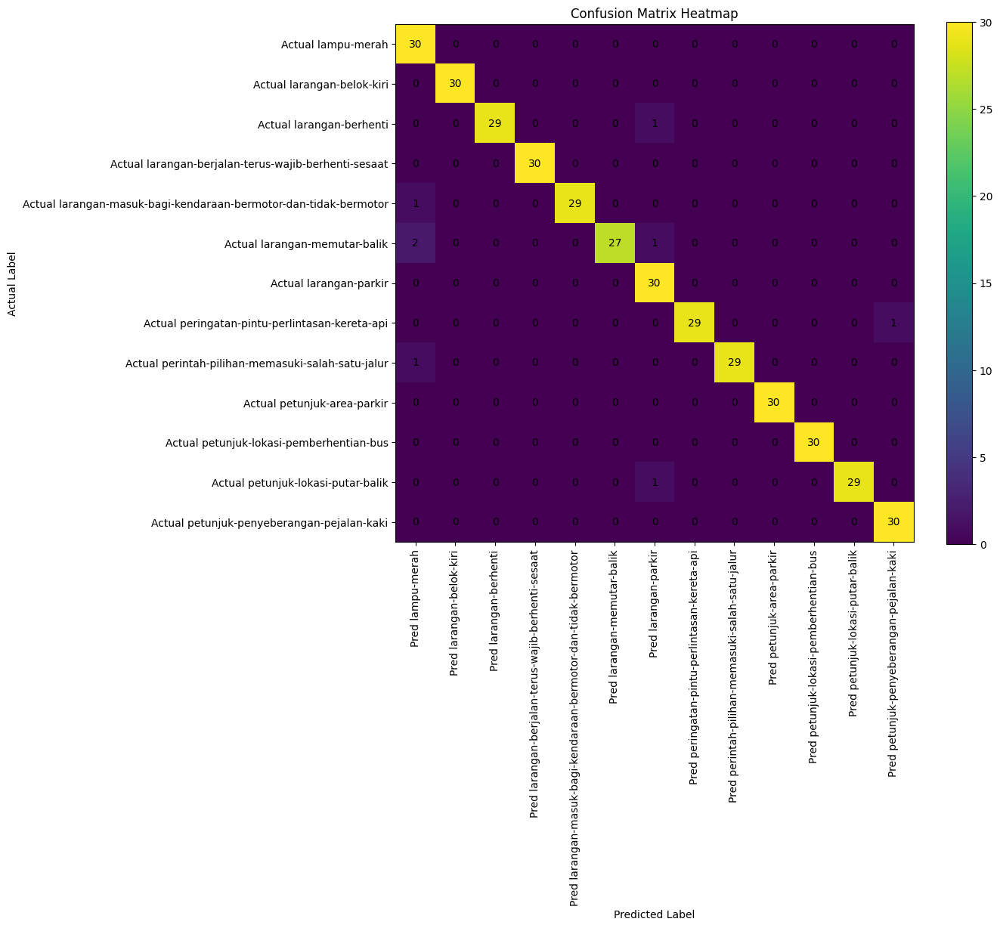

In [32]:
cm = df_cm.values
labels = df_cm.columns

plt.figure(figsize=(14, 12))
plt.imshow(cm)
plt.colorbar()

plt.xticks(range(len(labels)), labels, rotation=90)
plt.yticks(range(len(labels)), df_cm.index)

plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("Confusion Matrix Heatmap")

for i in range(cm.shape[0]):
  for j in range(cm.shape[1]):
    plt.text(j, i, cm[i, j],
         ha="center", va="center")

plt.tight_layout()
plt.show()

In [33]:
print("Mengevaluasi model pada Test Set...")
y_pred_73 = rf_model_73.predict(X_test_features_73)
accuracy_73 = accuracy_score(y_test_73, y_pred_73)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_73 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_73, y_pred_73, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 97.18%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.85      0.93      0.89        30
                                      larangan-belok-kiri       1.00      0.97      0.98        30
                                        larangan-berhenti       1.00      0.93      0.97        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       0.94      1.00      0.97        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      0.93      0.97        30
                                   larangan-memutar-balik       1.00      0.93      0.97        30
                                          larangan-parkir       0.97      0.97      0.97        30
                  peringatan-pintu-perlintasan-kereta-api       0.97      1.00      0.9

80:20

In [34]:
print("Mengevaluasi model pada Test Set...")
y_pred_82 = svm_model_82.predict(X_test_features_82)
accuracy_82 = accuracy_score(y_test_82, y_pred_82)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_82 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_82, y_pred_82, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 98.46%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.95      1.00      0.98        20
                                      larangan-belok-kiri       1.00      1.00      1.00        20
                                        larangan-berhenti       1.00      0.95      0.97        20
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        20
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      1.00      1.00        20
                                   larangan-memutar-balik       1.00      0.90      0.95        20
                                          larangan-parkir       0.91      1.00      0.95        20
                  peringatan-pintu-perlintasan-kereta-api       1.00      0.95      0.9

In [35]:
print("Mengevaluasi model pada Test Set...")
y_pred_82 = rf_model_82.predict(X_test_features_82)
accuracy_82 = accuracy_score(y_test_82, y_pred_82)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_82 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_82, y_pred_82, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 98.08%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.95      0.95      0.95        20
                                      larangan-belok-kiri       1.00      1.00      1.00        20
                                        larangan-berhenti       1.00      1.00      1.00        20
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      0.95      0.97        20
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       0.95      1.00      0.98        20
                                   larangan-memutar-balik       1.00      0.90      0.95        20
                                          larangan-parkir       0.95      0.95      0.95        20
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

90:10

In [36]:
print("Mengevaluasi model pada Test Set...")
y_pred_91 = svm_model_91.predict(X_test_features_91)
accuracy_91 = accuracy_score(y_test_91, y_pred_91)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_91 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_91, y_pred_91, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 99.23%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       1.00      1.00      1.00        10
                                      larangan-belok-kiri       1.00      1.00      1.00        10
                                        larangan-berhenti       1.00      1.00      1.00        10
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        10
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      1.00      1.00        10
                                   larangan-memutar-balik       1.00      0.90      0.95        10
                                          larangan-parkir       0.91      1.00      0.95        10
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

In [37]:
print("Mengevaluasi model pada Test Set...")
y_pred_91 = rf_model_91.predict(X_test_features_91)
accuracy_91 = accuracy_score(y_test_91, y_pred_91)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_91 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_91, y_pred_91, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 98.46%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       1.00      1.00      1.00        10
                                      larangan-belok-kiri       1.00      1.00      1.00        10
                                        larangan-berhenti       1.00      1.00      1.00        10
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        10
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       0.91      1.00      0.95        10
                                   larangan-memutar-balik       1.00      0.90      0.95        10
                                          larangan-parkir       0.90      0.90      0.90        10
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

# Save Model

PKL

In [38]:
MODEL_FILENAME = "svm_traffic_sign_model.pkl"
joblib.dump(svm_model_73, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: svm_traffic_sign_model.pkl


In [39]:
MODEL_FILENAME = "rf_traffic_sign_model.pkl"
joblib.dump(rf_model_73, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: rf_traffic_sign_model.pkl


ONNX

In [40]:
X_train_features_73 = np.array(X_train_features_73)

n_features = X_train_features_73.shape[1]

initial_type = [('float_input', FloatTensorType([None, n_features]))]

onnx_model = convert_sklearn(rf_model_73, initial_types=initial_type)

MODEL_FILENAME = "rf_traffic_sign_model.onnx"
onnx.save_model(onnx_model, MODEL_FILENAME)

print(f"Model ONNX berhasil disimpan ke: {MODEL_FILENAME}")

Model ONNX berhasil disimpan ke: rf_traffic_sign_model.onnx


In [41]:
X_train_features_73 = np.array(X_train_features_73)

n_features = X_train_features_73.shape[1]

initial_type = [('float_input', FloatTensorType([None, n_features]))]

onnx_model = convert_sklearn(svm_model_73, initial_types=initial_type)

MODEL_FILENAME = "svm_traffic_sign_model.onnx"
onnx.save_model(onnx_model, MODEL_FILENAME)

print(f"Model ONNX berhasil disimpan ke: {MODEL_FILENAME}")

Model ONNX berhasil disimpan ke: svm_traffic_sign_model.onnx


In [42]:
n_features

1892

# Test Saved Model

In [43]:
IMG_SIZE = (64, 64)

def preprocess_image_for_prediction(image_path):
    """
    Melakukan preprocessing HYBRID (HOG + Color)
    """
    try:
        img_bgr = cv2.imread(image_path)
        if img_bgr is None:
            raise ValueError("Gambar tidak terbaca!")

        resized_img_bgr = cv2.resize(img_bgr, IMG_SIZE)
        resized_img_rgb = cv2.cvtColor(resized_img_bgr, cv2.COLOR_BGR2RGB)

        gray_image = rgb2gray(resized_img_rgb)
        hog_features = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2),
                           orientations=9, visualize=False)

        hsv_image = cv2.cvtColor(resized_img_bgr, cv2.COLOR_BGR2HSV)
        color_hist = cv2.calcHist([hsv_image], [0, 1], None, [16, 8], [0, 180, 0, 256])
        cv2.normalize(color_hist, color_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
        color_features = color_hist.flatten()

        final_features = np.concatenate([hog_features, color_features])

        return final_features.reshape(1, -1).astype(np.float32)
    except Exception as e:
        print(f"Error preprocessing: {e}")
        return None


In [44]:
print("Upload file model .onnx:")
MODEL_PATH = "/content/rf_traffic_sign_model.onnx"

print("\nUpload file gambar:")
uploaded_img = files.upload()
IMAGE_PATH = list(uploaded_img.keys())[0]

session = ort.InferenceSession(MODEL_PATH)
input_name = session.get_inputs()[0].name
output_name = session.get_outputs()[0].name
print(f"Model {MODEL_PATH} berhasil dimuat!")

features = preprocess_image_for_prediction(IMAGE_PATH)
pred_index = "";

if features is not None:
  outputs = session.run(None, {input_name: features})
else:
  pred_index = None

if pred_index is not None:
  pred_index = int(outputs[0][0])
  prob_seq = outputs[1]

  prob_dict = prob_seq[0]

  confidence = prob_dict[pred_index] * 100
  pred_name = list_label[pred_index]

  print("\nHasil Prediksi")
  print(f"Label Prediksi : {pred_name}")
  print(f"Confidence    : {confidence:.2f}%")
else:
  print("Gagal melakukan prediksi.")

Upload file model .onnx:

Upload file gambar:


Saving petunjuk-penyeberangan-pejalan-kaki (72).jpg to petunjuk-penyeberangan-pejalan-kaki (72).jpg
Model /content/rf_traffic_sign_model.onnx berhasil dimuat!

Hasil Prediksi
Label Prediksi : petunjuk-penyeberangan-pejalan-kaki
Confidence    : 77.00%


In [45]:
MODEL_PATH = "/content/svm_traffic_sign_model.pkl"

loaded_model = joblib.load(MODEL_PATH)
single_features_reshaped = preprocess_image_for_prediction(IMAGE_PATH)
prediction_index = loaded_model.predict(single_features_reshaped)[0]

prediction_label_str = (
  list_label[prediction_index]
  if prediction_index < len(list_label)
  else "Label tidak dikenal"
)

print("\nHasil Prediksi:")
print(f"Label Sebenarnya : {prediction_index}")
print(f"Label Prediksi   : {prediction_label_str}")

proba = loaded_model.predict_proba(single_features_reshaped)
confidence = proba[0][prediction_index] * 100

print("\nHasil Prediksi:")
print(f"Label Prediksi : {prediction_label_str}")
print(f"Confidence     : {confidence:.2f}%")


Hasil Prediksi:
Label Sebenarnya : 12
Label Prediksi   : petunjuk-penyeberangan-pejalan-kaki

Hasil Prediksi:
Label Prediksi : petunjuk-penyeberangan-pejalan-kaki
Confidence     : 94.56%
